In [ ]:
def ATR_signal_cal(df,N,k1,k2):
    # 计算指标
    ohlc_df = df[['Open','High','Low','Close']].copy()
    # 计算TR
    ohlc_df['H-L'] = ohlc_df['High'] - ohlc_df['Low']
    ohlc_df['abs(H-C_1)'] = (ohlc_df['High'] - ohlc_df['Close'].shift(1)).abs()
    ohlc_df['abs(L-C_1)'] = (ohlc_df['Low'] - ohlc_df['Close'].shift(1)).abs()
    ohlc_df['TR'] = ohlc_df[['H-L','abs(H-C_1)','abs(L-C_1)']].max(axis=1)
    # 计算ATR
    ohlc_df['ATR'] = ohlc_df['TR'].rolling(N).mean()
    print(ohlc_df.head(20))
    print(ohlc_df.tail(20))
    # 计算上下轨
    ohlc_df['Upline'] = ohlc_df['Open'] + k1 * ohlc_df['ATR']
    ohlc_df['Downline'] = ohlc_df['Open'] - k2 * ohlc_df['ATR']
    print(ohlc_df.head(20))
    print(ohlc_df.tail(20))
    # 生成突破信号
    ohlc_df['signal'] = 0
    ohlc_df.loc[ohlc_df[ohlc_df['Close'] > ohlc_df['Upline']].index,'signal'] = 1
    ohlc_df.loc[ohlc_df[ohlc_df['Close'] < ohlc_df['Downline']].index,'signal'] = -1
    print(ohlc_df.head(20))
    print(ohlc_df.tail(20))

    return ohlc_df[['signal']]

In [ ]:
# 交易规则函数
def my_position_func(md_data, current_pos, user_data):

    if 'bar_index' not in user_data:
        user_data['bar_index'] = 0
    else:
        user_data['bar_index'] += 1
    target_pos = current_pos

    # 空仓时
    if current_pos == 0:
        user_data['volume'] = 0
        # 当出现交易信号时，按对应信号方向开仓
        if md_data['signal'] != 0:
            target_pos = md_data['signal']
            user_data['open_bar'] = user_data['bar_index']
    # 持有仓位时
    else:
        # 当信号与当前仓位方向相反时，平仓
        if current_pos * md_data['signal'] < 0:
            target_pos = 0
            user_data['open_bar'] = user_data['bar_index']
    return target_pos

In [ ]:
from collections import defaultdict
from typing import List, Dict

class BacktestTrade:
    """ 记录交易信息 """
    def __init__(self, is_open: bool, is_long: bool, price: float, volume: int, trading_day: str):
        self.is_open = is_open  # 是否开仓
        self.is_long = is_long  # 多空方向
        self.price = price  # 交易价格
        self.volume = volume  # 交易手数
        self.trading_day = trading_day  # 交易日期

class DailyResult:
    """ 记录每日交易结果 """
    def __init__(self, trading_day: str):
        self.trading_day = trading_day  # 交易日
        self.trades: List[BacktestTrade] = []  # 当天所有交易
        self.close_price = None  # 收盘价
        self.pnl = 0  # 当天盈亏


    def calculate_pnl(self, position: int, open_price: float):
        """ 计算每日盈亏 """
        if self.close_price is not None:
            self.pnl = position * (self.close_price - open_price)  # 盈亏计算
        return self.pnl

class SimpleBacktest:
    """ 简化回测框架，适用于单一指数 """
    def __init__(self, initial_cash: float):
        self.current_pos = 0  # 当前持仓
        self.trades = []  # 交易记录
        self.daily_results = {}  # 每日交易结果
        self.cash = initial_cash  # 账户资金
        self.target_pos = 0  # 目标持仓
        self.position_func = None  # 用户提供的持仓决策函数
        self.trade_size = 0  # 默认最小交易单位

    def process_data(self, md_data: Dict):
        """ 处理市场数据并执行交易 """
        trading_day = md_data.get('Date', None)

        if trading_day not in self.daily_results:
            self.daily_results[trading_day] = DailyResult(trading_day)

        self.daily_results[trading_day].close_price = md_data['Close']

        # 交易逻辑
        while self.target_pos != self.current_pos:
            is_open = (self.target_pos > self.current_pos and self.current_pos >= 0) or (
                    self.target_pos < self.current_pos and self.current_pos <= 0)         # 是否开仓
            is_long = (self.target_pos < self.current_pos and self.current_pos > 0) or (
                    self.target_pos > self.current_pos and self.current_pos >= 0)         # 多or空

            trade_volume = max(int(self.cash // md_data['Open']), 1)
            new_trade = BacktestTrade(is_open=is_open, is_long=is_long, price=md_data['Open'], volume=trade_volume, trading_day=trading_day)
            self.trades.append(new_trade)
            self.daily_results[trading_day].trades.append(new_trade)

            # 更新持仓
            if self.target_pos != 0:
                self.current_pos = self.target_pos
            else:
                self.current_pos = 0

        # 计算下一步的目标持仓
        if self.position_func:
            self.target_pos = self.position_func(md_data, self.current_pos, data)

    def run_backtest(self, market_data):
        """ 运行回测 """
        '''
        for md_data in market_data:
            self.process_data(md_data)
        '''
        # 遍历 DataFrame 每一行
        for _, row in market_data.iterrows():
            self.process_data(row.to_dict())  # 转换为字典传入
    def get_trades(self) -> List[BacktestTrade]:
        return self.trades

    def get_daily_results(self) -> Dict[str, DailyResult]:
        return self.daily_results


In [5]:
import yfinance as yf
import pandas as pd

sp500 = yf.Ticker("^GSPC")

# Get data for a specific date range
data = sp500.history(start="2020-01-01", end="2024-01-03")
data = data.reset_index()

# 将 Date 转换为日期格式，并去掉时间信息
data['Date'] = pd.to_datetime(data['Date']).dt.date

In [ ]:
# 1. 创建示例市场数据
import pandas as pd
# 2. 运行回测
backtest = SimpleBacktest(initial_cash=100000)
backtest.position_func = my_position_func  # 绑定持仓决策函数
backtest.run_backtest(data)

# 3. 查看回测结果
trades = backtest.get_trades()
daily_results = backtest.get_daily_results()

for trade in trades:
    print(f"Trade - Day: {trade.trading_day}, Price: {trade.price}, Volume: {trade.volume}, Long: {trade.is_long}")
'''
for day, result in daily_results.items():
    print(f"Day: {day}, PnL: {result.calculate_pnl(backtest.current_pos, result.trades[0].price if result.trades else 0)}")
'''

Trade - Day: 2020-01-27, Price: 3247.159912109375, Volume: 30, Long: False
Trade - Day: 2020-02-11, Price: 3365.8701171875, Volume: 29, Long: False
Trade - Day: 2020-02-26, Price: 3139.89990234375, Volume: 31, Long: False
Trade - Day: 2020-03-03, Price: 3096.4599609375, Volume: 32, Long: False
Trade - Day: 2020-03-13, Price: 2569.989990234375, Volume: 38, Long: False
Trade - Day: 2020-05-15, Price: 2829.949951171875, Volume: 35, Long: False
Trade - Day: 2020-06-12, Price: 3071.0400390625, Volume: 32, Long: False
Trade - Day: 2020-06-16, Price: 3131.0, Volume: 31, Long: False
Trade - Day: 2020-06-25, Price: 3046.60009765625, Volume: 32, Long: False
Trade - Day: 2020-07-01, Price: 3105.919921875, Volume: 32, Long: False
Trade - Day: 2020-07-14, Price: 3141.110107421875, Volume: 31, Long: False
Trade - Day: 2020-07-15, Price: 3225.97998046875, Volume: 30, Long: False
Trade - Day: 2020-07-24, Price: 3218.580078125, Volume: 31, Long: False
Trade - Day: 2020-07-30, Price: 3231.760009765625, 

'\nfor day, result in daily_results.items():\n    print(f"Day: {day}, PnL: {result.calculate_pnl(backtest.current_pos, result.trades[0].price if result.trades else 0)}")\n'

In [ ]:
data

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,2020-01-02,3244.669922,3258.139893,3235.530029,3257.850098,3459930000,0.0,0.0
1,2020-01-03,3226.360107,3246.149902,3222.340088,3234.850098,3484700000,0.0,0.0
2,2020-01-06,3217.550049,3246.840088,3214.639893,3246.280029,3702460000,0.0,0.0
3,2020-01-07,3241.860107,3244.909912,3232.429932,3237.179932,3435910000,0.0,0.0
4,2020-01-08,3238.590088,3267.070068,3236.669922,3253.050049,3726840000,0.0,0.0
...,...,...,...,...,...,...,...,...
1002,2023-12-26,4758.859863,4784.720215,4758.450195,4774.750000,2513910000,0.0,0.0
1003,2023-12-27,4773.450195,4785.390137,4768.899902,4781.580078,2748450000,0.0,0.0
1004,2023-12-28,4786.439941,4793.299805,4780.979980,4783.350098,2698860000,0.0,0.0
1005,2023-12-29,4782.879883,4788.430176,4751.990234,4769.830078,3126060000,0.0,0.0


In [ ]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import re
import datetime as dt

# 1️⃣ 设定参数空间 k1, k2
k1_values = [i / 10 for i in range(1, 31)]
k2_values = [i / 10 for i in range(30, 0, -1)]
para_space = [(k1, k2) for k1 in k1_values for k2 in k2_values]

# 2️⃣ 读取数据
data = data

# 4️⃣ 创建存储指标的 DataFrame
metrics = ['annual_return', 'annual_volatility', 'sharpe_ratio', 'max_drawdown', 'win_rate']
results_dict = {metric: pd.DataFrame(index=k2_values, columns=k1_values) for metric in metrics}

# 5️⃣ 定义 `pnl_cal()` 计算指标
def pnl_cal(values, train_df):
    """ 计算 k1, k2 对应的回测指标 """
    k1, k2 = values
    signal = ATR_signal_cal(train_df, 5, k1, k2)
    train_df['signal'] = signal['signal']
    ''' 计算信号（示例策略：简单 ATR 计算）
    signal = (train_df['Close'].diff().rolling(int(k1)).mean() / train_df['Close'].rolling(int(k2)).std()).fillna(0)
    train_df['signal'] = np.sign(signal)
    '''
    # 计算收益
    train_df['pnl'] = train_df['signal'].shift(1) * train_df['Close'].pct_change()

    # 计算年化收益率
    annual_return = train_df['pnl'].mean() * 252

    # 计算年化波动率
    annual_volatility = train_df['pnl'].std() * np.sqrt(252)

    # 计算夏普比率
    sharpe_ratio = annual_return / annual_volatility if annual_volatility != 0 else 0

    # 计算最大回撤
    cum_pnl = (1 + train_df['pnl']).cumprod()
    max_drawdown = (cum_pnl / cum_pnl.cummax() - 1).min()

    # 计算胜率
    win_rate = (train_df['pnl'] > 0).sum() / len(train_df['pnl'])

    return [k1, k2, annual_return, annual_volatility, sharpe_ratio, max_drawdown, win_rate]

In [ ]:
for i, (k1, k2) in enumerate(tqdm(para_space)):
    k1_k2_metrics = pnl_cal([k1, k2], data)

    # 解包计算结果
    k1, k2, annual_return, annual_volatility, sharpe_ratio, max_drawdown, win_rate = k1_k2_metrics
    print(annual_return)

    # 存储到 DataFrame
    results_dict['annual_return'].loc[k2, k1] = annual_return
    results_dict['annual_volatility'].loc[k2, k1] = annual_volatility
    results_dict['sharpe_ratio'].loc[k2, k1] = sharpe_ratio
    results_dict['max_drawdown'].loc[k2, k1] = max_drawdown
    results_dict['win_rate'].loc[k2, k1] = win_rate

  0%|          | 2/900 [00:00<00:52, 17.04it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  1%|          | 6/900 [00:00<00:58, 15.22it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  1%|          | 8/900 [00:00<01:02, 14.29it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  1%|          | 10/900 [00:00<01:29,  9.99it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  1%|▏         | 12/900 [00:01<02:04,  7.13it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

  1%|▏         | 13/900 [00:01<02:32,  5.83it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  2%|▏         | 14/900 [00:01<03:16,  4.51it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  2%|▏         | 16/900 [00:02<03:31,  4.19it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  2%|▏         | 20/900 [00:02<02:01,  7.27it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

  2%|▏         | 22/900 [00:03<01:41,  8.64it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

  3%|▎         | 26/900 [00:03<01:17, 11.25it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  3%|▎         | 31/900 [00:03<00:57, 15.08it/s]

-0.10193361299927738
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

  4%|▍         | 35/900 [00:03<00:51, 16.67it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  4%|▍         | 37/900 [00:03<00:51, 16.85it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  5%|▍         | 43/900 [00:04<00:43, 19.65it/s]

-0.04576681480167169
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

  5%|▌         | 49/900 [00:04<00:41, 20.55it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  6%|▌         | 52/900 [00:04<00:42, 19.91it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  6%|▋         | 57/900 [00:04<00:43, 19.60it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  7%|▋         | 62/900 [00:05<00:41, 20.33it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

  7%|▋         | 65/900 [00:05<00:41, 20.21it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

  8%|▊         | 71/900 [00:05<00:40, 20.69it/s]

-0.05174193537499594
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

  8%|▊         | 74/900 [00:05<00:41, 19.84it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  9%|▉         | 79/900 [00:05<00:41, 19.86it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

  9%|▉         | 81/900 [00:06<00:42, 19.18it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 10%|▉         | 87/900 [00:06<00:40, 20.16it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 10%|█         | 92/900 [00:06<00:40, 19.80it/s]

-0.14578472471074286
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 10%|█         | 94/900 [00:06<00:44, 18.07it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 11%|█         | 98/900 [00:06<00:43, 18.25it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 11%|█▏        | 102/900 [00:07<00:43, 18.44it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 12%|█▏        | 107/900 [00:07<00:42, 18.74it/s]

-0.06408724256397517
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 12%|█▏        | 111/900 [00:07<00:43, 17.96it/s]

-0.05887822933185934
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 13%|█▎        | 113/900 [00:07<00:48, 16.15it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 13%|█▎        | 119/900 [00:08<00:42, 18.51it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 14%|█▎        | 123/900 [00:08<00:42, 18.22it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 14%|█▍        | 125/900 [00:08<00:46, 16.81it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 14%|█▍        | 129/900 [00:08<00:43, 17.64it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 15%|█▍        | 133/900 [00:08<00:45, 16.87it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 15%|█▌        | 137/900 [00:09<00:44, 17.22it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 16%|█▌        | 141/900 [00:09<00:44, 17.07it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 16%|█▌        | 145/900 [00:09<00:44, 16.89it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 16%|█▋        | 147/900 [00:09<00:47, 15.88it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 17%|█▋        | 152/900 [00:10<00:44, 16.99it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 17%|█▋        | 156/900 [00:10<00:42, 17.33it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 18%|█▊        | 160/900 [00:10<00:42, 17.49it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 18%|█▊        | 164/900 [00:10<00:43, 17.03it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 18%|█▊        | 166/900 [00:10<00:45, 16.08it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 19%|█▉        | 170/900 [00:11<00:44, 16.34it/s]

-0.02438436009401816
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 19%|█▉        | 174/900 [00:11<00:43, 16.64it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 20%|█▉        | 178/900 [00:11<00:43, 16.58it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 20%|██        | 182/900 [00:11<00:43, 16.56it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 21%|██        | 186/900 [00:12<00:43, 16.29it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 21%|██        | 190/900 [00:12<00:42, 16.85it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 21%|██▏       | 192/900 [00:12<00:43, 16.26it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 22%|██▏       | 196/900 [00:12<00:43, 16.27it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 22%|██▏       | 200/900 [00:13<00:44, 15.87it/s]

-0.014869359876610233
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 22%|██▏       | 202/900 [00:13<00:45, 15.36it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 23%|██▎       | 206/900 [00:13<00:48, 14.43it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 23%|██▎       | 208/900 [00:13<00:49, 14.02it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 23%|██▎       | 210/900 [00:13<00:51, 13.43it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 24%|██▍       | 214/900 [00:14<00:54, 12.54it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 24%|██▍       | 216/900 [00:14<00:52, 13.05it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 24%|██▍       | 220/900 [00:14<00:48, 13.96it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 25%|██▍       | 222/900 [00:14<00:47, 14.42it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 25%|██▌       | 226/900 [00:14<00:50, 13.27it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 25%|██▌       | 228/900 [00:15<00:52, 12.76it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 26%|██▌       | 230/900 [00:15<00:52, 12.83it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 26%|██▌       | 232/900 [00:15<00:53, 12.51it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 26%|██▌       | 236/900 [00:15<00:53, 12.36it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 26%|██▋       | 238/900 [00:15<00:51, 12.78it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 27%|██▋       | 242/900 [00:16<00:51, 12.73it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 27%|██▋       | 244/900 [00:16<00:49, 13.26it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 27%|██▋       | 246/900 [00:16<00:49, 13.25it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 28%|██▊       | 250/900 [00:16<00:52, 12.46it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 28%|██▊       | 252/900 [00:17<00:52, 12.31it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 28%|██▊       | 254/900 [00:17<00:52, 12.42it/s]

0.0017242195357838484
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 29%|██▊       | 258/900 [00:17<00:53, 12.10it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 29%|██▉       | 260/900 [00:17<00:56, 11.43it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 29%|██▉       | 262/900 [00:17<00:57, 11.18it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 29%|██▉       | 264/900 [00:18<00:54, 11.77it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 30%|██▉       | 266/900 [00:18<00:57, 10.93it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 30%|███       | 270/900 [00:18<00:56, 11.19it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 30%|███       | 272/900 [00:18<00:51, 12.11it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 31%|███       | 276/900 [00:19<00:46, 13.31it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 31%|███       | 278/900 [00:19<00:46, 13.45it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 31%|███▏      | 282/900 [00:19<00:45, 13.69it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 32%|███▏      | 286/900 [00:19<00:42, 14.53it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 32%|███▏      | 288/900 [00:19<00:41, 14.76it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 32%|███▏      | 292/900 [00:20<00:41, 14.82it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 33%|███▎      | 294/900 [00:20<00:40, 15.05it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 33%|███▎      | 298/900 [00:20<00:41, 14.37it/s]

-0.0761247782999719
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323

 33%|███▎      | 300/900 [00:20<00:42, 14.12it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 34%|███▍      | 304/900 [00:20<00:40, 14.63it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 34%|███▍      | 308/900 [00:21<00:39, 14.89it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 34%|███▍      | 310/900 [00:21<00:40, 14.64it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 35%|███▍      | 314/900 [00:21<00:42, 13.90it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 35%|███▌      | 316/900 [00:21<00:42, 13.84it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 36%|███▌      | 320/900 [00:22<00:39, 14.84it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 36%|███▌      | 322/900 [00:22<00:38, 15.08it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 36%|███▌      | 326/900 [00:22<00:37, 15.32it/s]

-0.035231725440123804
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 37%|███▋      | 330/900 [00:22<00:37, 15.26it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 37%|███▋      | 332/900 [00:22<00:38, 14.61it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 37%|███▋      | 336/900 [00:23<00:37, 14.85it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 38%|███▊      | 338/900 [00:23<00:38, 14.60it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 38%|███▊      | 342/900 [00:23<00:37, 14.85it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 38%|███▊      | 344/900 [00:23<00:37, 14.71it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 39%|███▊      | 348/900 [00:23<00:38, 14.45it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 39%|███▉      | 350/900 [00:24<00:37, 14.59it/s]

0.0032604213765024285
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 39%|███▉      | 354/900 [00:24<00:37, 14.65it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 40%|███▉      | 358/900 [00:24<00:36, 14.69it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 40%|████      | 360/900 [00:24<00:36, 14.62it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 40%|████      | 364/900 [00:25<00:36, 14.60it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 41%|████      | 368/900 [00:25<00:34, 15.22it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 41%|████      | 370/900 [00:25<00:34, 15.28it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 42%|████▏     | 374/900 [00:25<00:35, 14.90it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 42%|████▏     | 376/900 [00:25<00:36, 14.48it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 42%|████▏     | 380/900 [00:26<00:35, 14.78it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 43%|████▎     | 384/900 [00:26<00:33, 15.50it/s]

-0.01921857825073802
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 43%|████▎     | 386/900 [00:26<00:33, 15.48it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 43%|████▎     | 390/900 [00:26<00:34, 15.00it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 44%|████▎     | 392/900 [00:26<00:32, 15.40it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 44%|████▍     | 396/900 [00:27<00:32, 15.37it/s]

-0.0054816849462716215
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3

 44%|████▍     | 400/900 [00:27<00:31, 15.69it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 45%|████▍     | 402/900 [00:27<00:32, 15.50it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 45%|████▌     | 406/900 [00:27<00:33, 14.95it/s]

-0.003978070057307824
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 45%|████▌     | 408/900 [00:27<00:32, 15.05it/s]

-0.008708498020435272
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 46%|████▌     | 412/900 [00:28<00:32, 15.06it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 46%|████▌     | 416/900 [00:28<00:31, 15.53it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 46%|████▋     | 418/900 [00:28<00:31, 15.37it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 47%|████▋     | 422/900 [00:28<00:35, 13.65it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 47%|████▋     | 424/900 [00:29<00:36, 13.19it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 47%|████▋     | 426/900 [00:29<00:37, 12.67it/s]

-0.006144766204864279
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 48%|████▊     | 430/900 [00:29<00:37, 12.59it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 48%|████▊     | 432/900 [00:29<00:37, 12.41it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 48%|████▊     | 434/900 [00:29<00:36, 12.66it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 49%|████▊     | 438/900 [00:30<00:36, 12.58it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 49%|████▉     | 440/900 [00:30<00:37, 12.25it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 49%|████▉     | 442/900 [00:30<00:37, 12.26it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 49%|████▉     | 444/900 [00:30<00:38, 11.72it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 50%|████▉     | 448/900 [00:31<00:37, 11.99it/s]

-0.08614828100949584
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 50%|█████     | 450/900 [00:31<00:35, 12.52it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 50%|█████     | 452/900 [00:31<00:36, 12.36it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 50%|█████     | 454/900 [00:31<00:36, 12.33it/s]

-0.00021733953374608185
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  

 51%|█████     | 458/900 [00:31<00:39, 11.24it/s]

-0.00021733953374608185
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  

 51%|█████     | 460/900 [00:32<00:39, 11.06it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 51%|█████▏    | 462/900 [00:32<00:40, 10.91it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 52%|█████▏    | 464/900 [00:32<00:39, 11.04it/s]

0.003731283054878452
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 52%|█████▏    | 466/900 [00:32<00:40, 10.69it/s]

-0.0037685817772083637
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3

 52%|█████▏    | 468/900 [00:32<00:42, 10.17it/s]

-0.003444152607909732
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 52%|█████▏    | 470/900 [00:33<00:41, 10.44it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 52%|█████▏    | 472/900 [00:33<00:42, 10.12it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 53%|█████▎    | 474/900 [00:33<00:41, 10.23it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 53%|█████▎    | 476/900 [00:33<00:41, 10.19it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 53%|█████▎    | 480/900 [00:34<00:39, 10.70it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 54%|█████▎    | 482/900 [00:34<00:35, 11.62it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 54%|█████▍    | 486/900 [00:34<00:31, 13.14it/s]

-0.00021733953374608185
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  

 54%|█████▍    | 488/900 [00:34<00:30, 13.37it/s]

-0.00021733953374608185
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  

 55%|█████▍    | 492/900 [00:34<00:28, 14.22it/s]

-0.00021733953374608185
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  

 55%|█████▌    | 496/900 [00:35<00:26, 15.03it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 55%|█████▌    | 498/900 [00:35<00:26, 15.18it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 56%|█████▌    | 502/900 [00:35<00:25, 15.57it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 56%|█████▌    | 506/900 [00:35<00:26, 15.10it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 56%|█████▋    | 508/900 [00:35<00:25, 15.27it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 57%|█████▋    | 512/900 [00:36<00:24, 15.56it/s]

-0.15934409522200468
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 57%|█████▋    | 516/900 [00:36<00:23, 16.01it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 58%|█████▊    | 520/900 [00:36<00:24, 15.69it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 58%|█████▊    | 522/900 [00:36<00:24, 15.17it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 58%|█████▊    | 526/900 [00:37<00:25, 14.71it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 59%|█████▊    | 528/900 [00:37<00:25, 14.80it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 59%|█████▉    | 532/900 [00:37<00:24, 14.94it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 59%|█████▉    | 534/900 [00:37<00:25, 14.62it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 60%|█████▉    | 538/900 [00:37<00:24, 14.71it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 60%|██████    | 540/900 [00:38<00:24, 14.70it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 60%|██████    | 544/900 [00:38<00:23, 15.38it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 61%|██████    | 548/900 [00:38<00:23, 15.30it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 61%|██████    | 550/900 [00:38<00:23, 15.05it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 62%|██████▏   | 554/900 [00:39<00:24, 14.37it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 62%|██████▏   | 556/900 [00:39<00:23, 14.51it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 62%|██████▏   | 560/900 [00:39<00:22, 15.01it/s]


             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000 

 62%|██████▏   | 562/900 [00:39<00:22, 15.17it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 63%|██████▎   | 566/900 [00:39<00:21, 15.41it/s]

-0.034502423185224264
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 63%|██████▎   | 570/900 [00:40<00:21, 15.36it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 64%|██████▎   | 572/900 [00:40<00:22, 14.77it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 64%|██████▍   | 576/900 [00:40<00:20, 15.49it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 64%|██████▍   | 578/900 [00:40<00:21, 15.10it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 65%|██████▍   | 582/900 [00:40<00:20, 15.29it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 65%|██████▌   | 586/900 [00:41<00:20, 15.29it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 65%|██████▌   | 588/900 [00:41<00:21, 14.52it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 66%|██████▌   | 592/900 [00:41<00:21, 14.46it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 66%|██████▌   | 594/900 [00:41<00:21, 14.38it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 66%|██████▋   | 598/900 [00:41<00:20, 15.09it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 67%|██████▋   | 602/900 [00:42<00:19, 15.36it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 67%|██████▋   | 604/900 [00:42<00:20, 14.44it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 68%|██████▊   | 608/900 [00:42<00:19, 14.65it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 68%|██████▊   | 610/900 [00:42<00:19, 14.89it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 68%|██████▊   | 614/900 [00:43<00:19, 14.80it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 68%|██████▊   | 616/900 [00:43<00:19, 14.60it/s]

-0.003551242243462282
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 69%|██████▉   | 620/900 [00:43<00:20, 13.66it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 69%|██████▉   | 622/900 [00:43<00:20, 13.70it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 70%|██████▉   | 626/900 [00:43<00:19, 13.98it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 70%|██████▉   | 628/900 [00:44<00:20, 13.40it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 70%|███████   | 630/900 [00:44<00:21, 12.40it/s]

-0.12406858602632027
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 70%|███████   | 632/900 [00:44<00:21, 12.33it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 71%|███████   | 636/900 [00:44<00:22, 11.62it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 71%|███████   | 638/900 [00:44<00:22, 11.56it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 71%|███████   | 640/900 [00:45<00:22, 11.67it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 72%|███████▏  | 644/900 [00:45<00:21, 12.18it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 72%|███████▏  | 646/900 [00:45<00:21, 11.87it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 72%|███████▏  | 648/900 [00:45<00:23, 10.95it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 72%|███████▏  | 650/900 [00:45<00:21, 11.37it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 72%|███████▏  | 652/900 [00:46<00:22, 11.16it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 73%|███████▎  | 656/900 [00:46<00:20, 11.64it/s]

-0.034285083651478185
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 73%|███████▎  | 658/900 [00:46<00:20, 11.98it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 74%|███████▎  | 662/900 [00:46<00:19, 12.46it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 74%|███████▍  | 664/900 [00:47<00:18, 12.72it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 74%|███████▍  | 666/900 [00:47<00:18, 12.72it/s]

0.0
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.87

 74%|███████▍  | 670/900 [00:47<00:19, 12.05it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 75%|███████▍  | 672/900 [00:47<00:19, 11.48it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 75%|███████▍  | 674/900 [00:48<00:20, 11.20it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 75%|███████▌  | 676/900 [00:48<00:20, 11.17it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 75%|███████▌  | 678/900 [00:48<00:19, 11.18it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 76%|███████▌  | 682/900 [00:48<00:18, 11.79it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 76%|███████▌  | 684/900 [00:48<00:18, 11.72it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 76%|███████▌  | 686/900 [00:49<00:18, 11.73it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 77%|███████▋  | 690/900 [00:49<00:16, 12.81it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 77%|███████▋  | 692/900 [00:49<00:15, 13.36it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 77%|███████▋  | 696/900 [00:49<00:14, 14.23it/s]

0.0
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.87

 78%|███████▊  | 698/900 [00:49<00:14, 13.54it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 78%|███████▊  | 702/900 [00:50<00:13, 14.64it/s]

0.0
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.87

 78%|███████▊  | 706/900 [00:50<00:12, 15.04it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 79%|███████▊  | 708/900 [00:50<00:12, 14.83it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 79%|███████▉  | 712/900 [00:50<00:13, 14.41it/s]

0.003457203224455434
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 79%|███████▉  | 714/900 [00:50<00:13, 14.14it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 80%|███████▉  | 718/900 [00:51<00:12, 14.81it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 80%|████████  | 722/900 [00:51<00:11, 15.17it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 80%|████████  | 724/900 [00:51<00:11, 14.89it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 81%|████████  | 728/900 [00:51<00:11, 15.27it/s]

0.0
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.87

 81%|████████▏ | 732/900 [00:52<00:10, 15.59it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 82%|████████▏ | 734/900 [00:52<00:10, 15.61it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 82%|████████▏ | 738/900 [00:52<00:10, 15.41it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 82%|████████▏ | 740/900 [00:52<00:10, 15.30it/s]

0.009862136224195893
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 83%|████████▎ | 744/900 [00:52<00:10, 15.37it/s]

-0.009890834474263688
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 83%|████████▎ | 748/900 [00:53<00:10, 15.08it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 83%|████████▎ | 750/900 [00:53<00:09, 15.26it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 84%|████████▍ | 754/900 [00:53<00:09, 15.57it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 84%|████████▍ | 758/900 [00:53<00:09, 15.45it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 84%|████████▍ | 760/900 [00:53<00:08, 15.66it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 85%|████████▍ | 764/900 [00:54<00:09, 14.85it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 85%|████████▌ | 766/900 [00:54<00:08, 15.18it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 86%|████████▌ | 770/900 [00:54<00:08, 14.75it/s]

0.006712628121079623
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 86%|████████▌ | 774/900 [00:54<00:08, 15.07it/s]

-0.011869587305331514
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  33

 86%|████████▌ | 776/900 [00:55<00:08, 15.23it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 87%|████████▋ | 780/900 [00:55<00:08, 14.35it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 87%|████████▋ | 782/900 [00:55<00:08, 14.28it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 87%|████████▋ | 784/900 [00:55<00:08, 13.80it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 88%|████████▊ | 788/900 [00:55<00:08, 13.89it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 88%|████████▊ | 792/900 [00:56<00:07, 14.77it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 88%|████████▊ | 794/900 [00:56<00:07, 15.12it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 89%|████████▊ | 798/900 [00:56<00:06, 14.94it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 89%|████████▉ | 800/900 [00:56<00:06, 14.87it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 89%|████████▉ | 804/900 [00:56<00:06, 15.13it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 90%|████████▉ | 808/900 [00:57<00:05, 15.74it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 90%|█████████ | 810/900 [00:57<00:05, 15.58it/s]

-0.12406858602632027
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 90%|█████████ | 814/900 [00:57<00:05, 14.48it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 91%|█████████ | 816/900 [00:57<00:05, 14.20it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 91%|█████████ | 820/900 [00:58<00:05, 14.51it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 92%|█████████▏| 824/900 [00:58<00:05, 15.11it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 92%|█████████▏| 826/900 [00:58<00:04, 15.08it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 92%|█████████▏| 830/900 [00:58<00:04, 14.59it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 92%|█████████▏| 832/900 [00:58<00:04, 14.56it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 93%|█████████▎| 836/900 [00:59<00:04, 14.31it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 93%|█████████▎| 838/900 [00:59<00:04, 13.75it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 93%|█████████▎| 840/900 [00:59<00:04, 13.52it/s]

-0.12406858602632027
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  332

 94%|█████████▎| 842/900 [00:59<00:04, 12.91it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 94%|█████████▍| 846/900 [00:59<00:04, 12.45it/s]

0.0
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.87

 94%|█████████▍| 848/900 [01:00<00:04, 13.00it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 95%|█████████▍| 852/900 [01:00<00:03, 13.85it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 95%|█████████▍| 854/900 [01:00<00:03, 13.91it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 95%|█████████▌| 858/900 [01:00<00:03, 13.23it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 96%|█████████▌| 860/900 [01:01<00:03, 13.10it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 96%|█████████▌| 862/900 [01:01<00:03, 12.59it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 96%|█████████▌| 866/900 [01:01<00:02, 12.80it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 96%|█████████▋| 868/900 [01:01<00:02, 12.64it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 97%|█████████▋| 870/900 [01:01<00:02, 12.16it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 97%|█████████▋| 874/900 [01:02<00:02, 12.97it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 97%|█████████▋| 876/900 [01:02<00:01, 12.82it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 98%|█████████▊| 878/900 [01:02<00:01, 11.93it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 98%|█████████▊| 880/900 [01:02<00:01, 11.54it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 98%|█████████▊| 884/900 [01:02<00:01, 11.80it/s]

0.0
           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.87

 98%|█████████▊| 886/900 [01:03<00:01, 12.28it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 99%|█████████▉| 890/900 [01:03<00:00, 13.23it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

 99%|█████████▉| 892/900 [01:03<00:00, 12.82it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

 99%|█████████▉| 894/900 [01:03<00:00, 12.57it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

100%|█████████▉| 898/900 [01:04<00:00, 12.29it/s]

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

100%|██████████| 900/900 [01:04<00:00, 14.01it/s]

             Open         High          Low        Close        H-L  \
987   4564.370117  4572.370117  4546.720215  4569.779785  25.649902   
988   4557.250000  4578.560059  4551.680176  4567.180176  26.879883   
989   4586.229980  4590.740234  4546.500000  4549.339844  44.240234   
990   4568.839844  4590.919922  4565.220215  4585.589844  25.699707   
991   4576.200195  4609.229980  4574.060059  4604.370117  35.169922   
992   4593.390137  4623.709961  4593.390137  4622.439941  30.319824   
993   4618.299805  4643.930176  4608.089844  4643.700195  35.840332   
994   4646.200195  4709.689941  4643.229980  4707.089844  66.459961   
995   4721.040039  4738.569824  4694.339844  4719.549805  44.229980   
996   4714.229980  4725.529785  4704.689941  4719.189941  20.839844   
997   4725.580078  4749.520020  4725.580078  4740.560059  23.939941   
998   4743.720215  4768.689941  4743.720215  4768.370117  24.969727   
999   4764.729980  4778.009766  4697.819824  4698.350098  80.189941   
1000  

In [ ]:
results_dict['win_rate'].loc[1,1.2]

0.026812313803376366

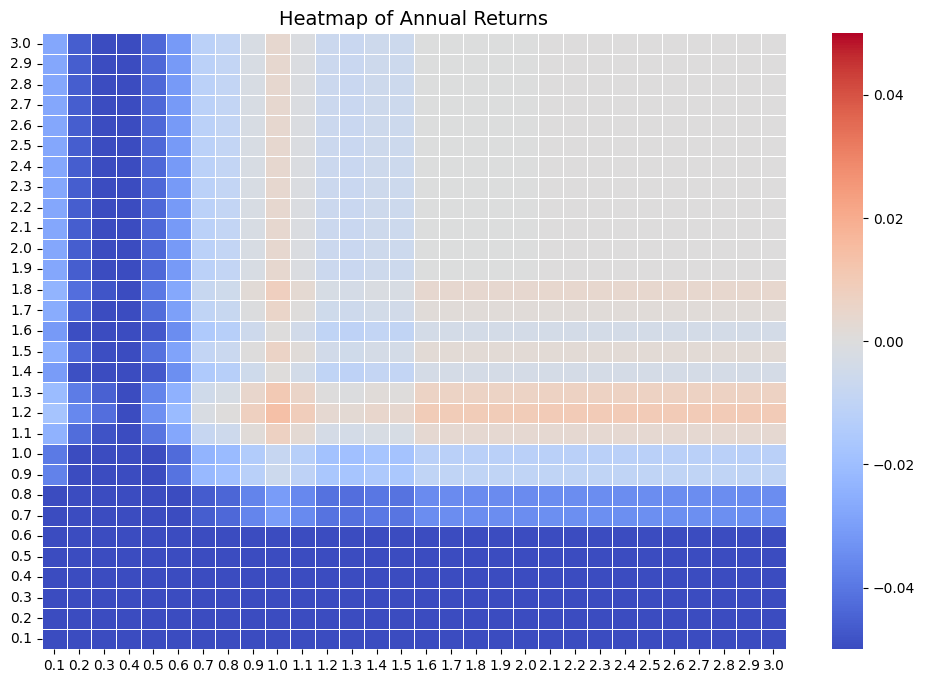

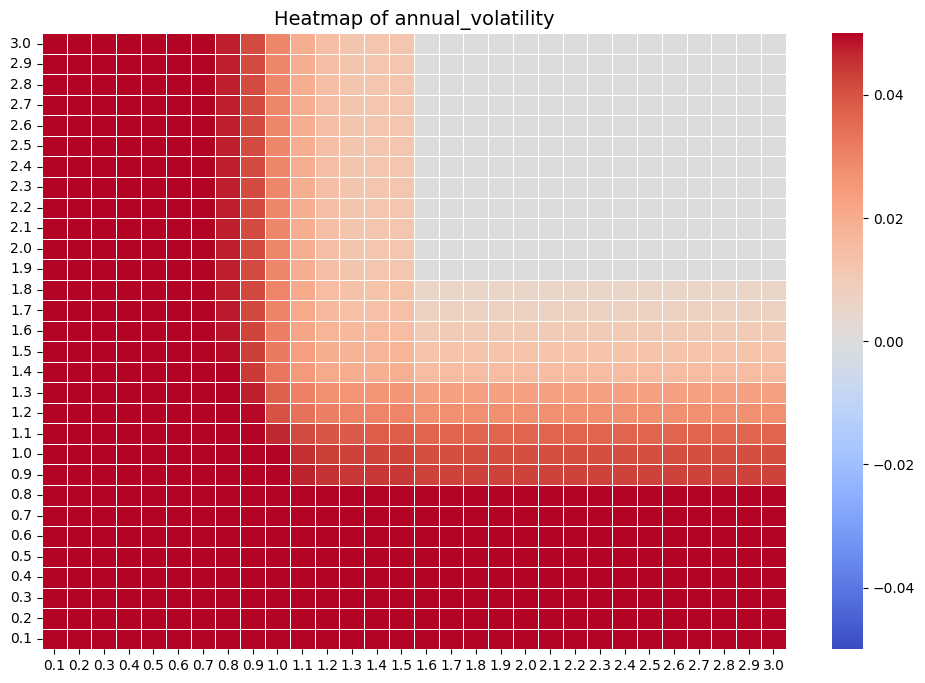

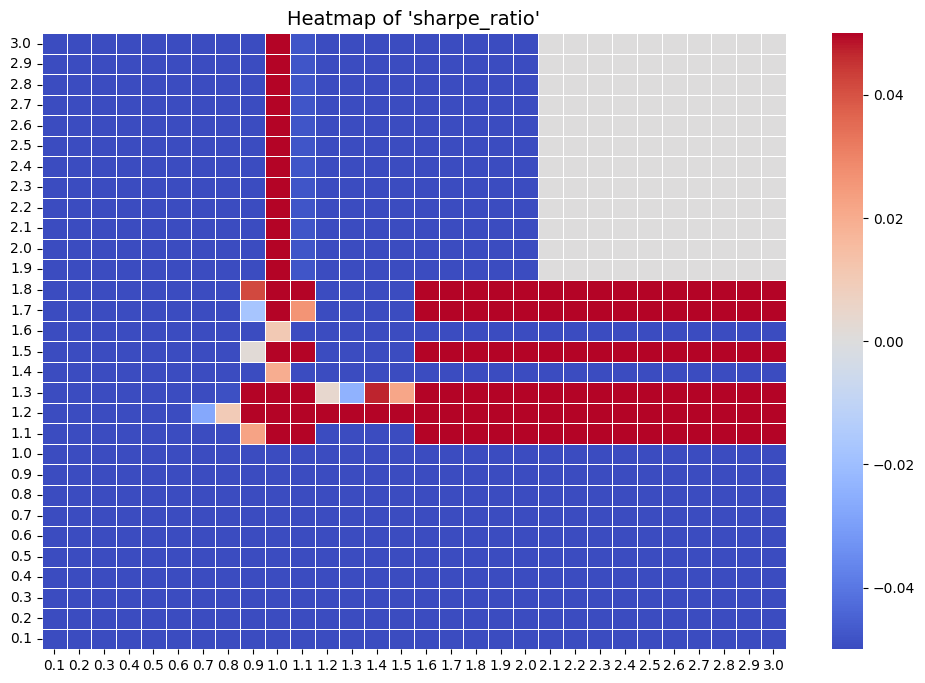

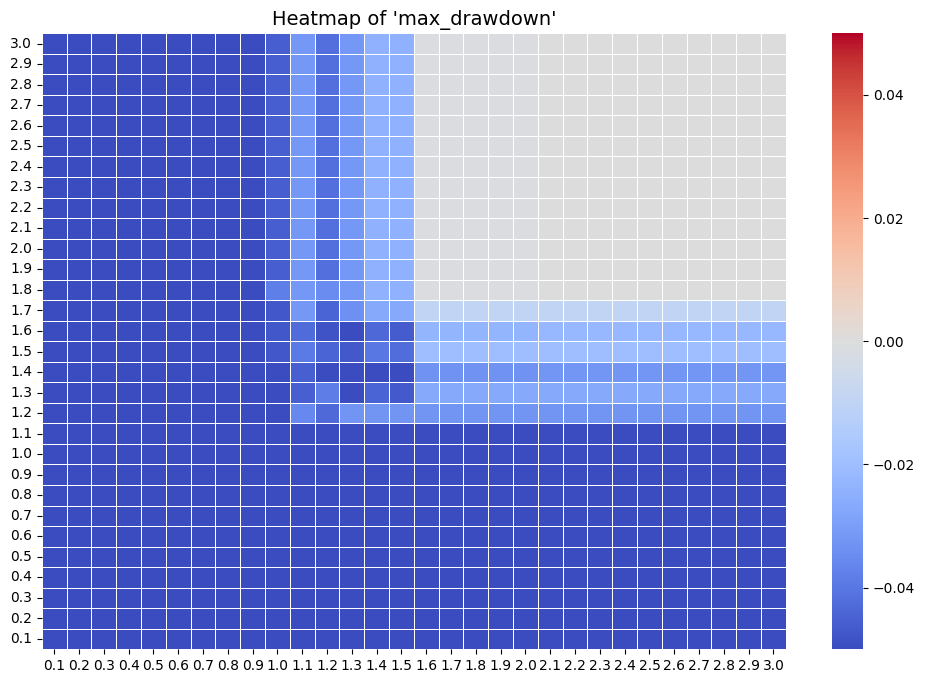

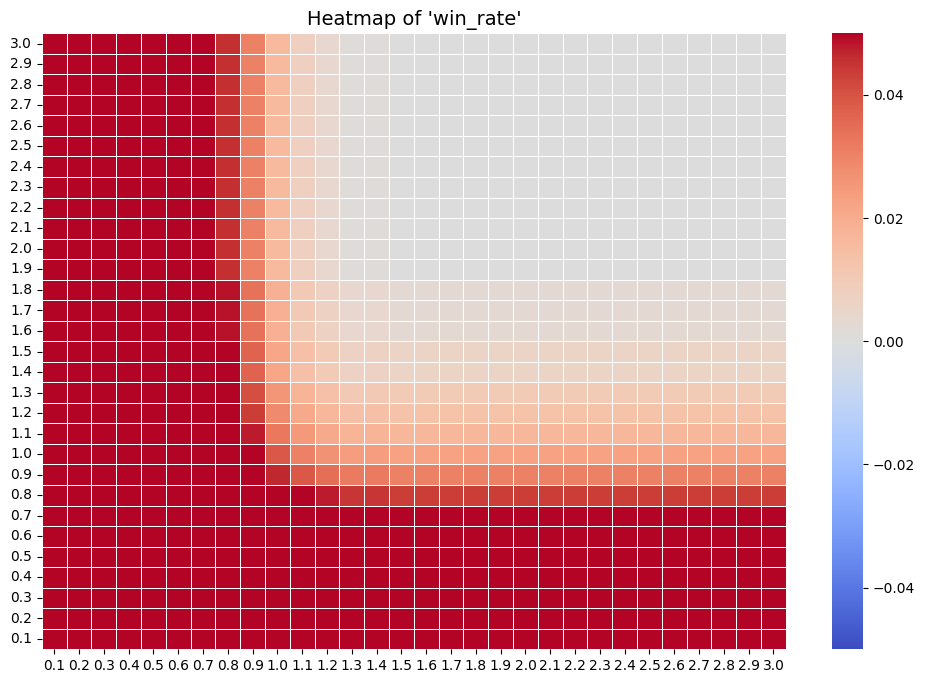

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

results_dict['annual_return'] = results_dict['annual_return'].apply(pd.to_numeric, errors='coerce')
plt.figure(figsize=(12, 8))
# sns.heatmap(results_dict['annual_return'], cmap="coolwarm", annot=False, fmt=".4f", linewidths=0.5)
sns.heatmap(results_dict['annual_return'], cmap="coolwarm", annot=False, fmt=".4f", linewidths=0.5,
            vmin=-0.05, vmax=0.05)  # 你可以调整这个范围
plt.title("Heatmap of Annual Returns", fontsize=14)
plt.show()

results_dict['annual_volatility'] = results_dict['annual_volatility'].apply(pd.to_numeric, errors='coerce')
plt.figure(figsize=(12, 8))
# sns.heatmap(results_dict['annual_return'], cmap="coolwarm", annot=False, fmt=".4f", linewidths=0.5)
sns.heatmap(results_dict['annual_volatility'], cmap="coolwarm", annot=False, fmt=".4f", linewidths=0.5,
            vmin=-0.05, vmax=0.05)  # 你可以调整这个范围
plt.title("Heatmap of annual_volatility", fontsize=14)
plt.show()

results_dict['sharpe_ratio'] = results_dict['sharpe_ratio'].apply(pd.to_numeric, errors='coerce')
plt.figure(figsize=(12, 8))
# sns.heatmap(results_dict['annual_return'], cmap="coolwarm", annot=False, fmt=".4f", linewidths=0.5)
sns.heatmap(results_dict['sharpe_ratio'], cmap="coolwarm", annot=False, fmt=".4f", linewidths=0.5,
            vmin=-0.05, vmax=0.05)  # 你可以调整这个范围
plt.title("Heatmap of 'sharpe_ratio'", fontsize=14)
plt.show()

results_dict['max_drawdown'] = results_dict['max_drawdown'].apply(pd.to_numeric, errors='coerce')
plt.figure(figsize=(12, 8))
# sns.heatmap(results_dict['annual_return'], cmap="coolwarm", annot=False, fmt=".4f", linewidths=0.5)
sns.heatmap(results_dict['max_drawdown'], cmap="coolwarm", annot=False, fmt=".4f", linewidths=0.5,
            vmin=-0.05, vmax=0.05)  # 你可以调整这个范围
plt.title("Heatmap of 'max_drawdown'", fontsize=14)
plt.show()

results_dict['win_rate'] = results_dict['win_rate'].apply(pd.to_numeric, errors='coerce')
plt.figure(figsize=(12, 8))
# sns.heatmap(results_dict['annual_return'], cmap="coolwarm", annot=False, fmt=".4f", linewidths=0.5)
sns.heatmap(results_dict['win_rate'], cmap="coolwarm", annot=False, fmt=".4f", linewidths=0.5,
            vmin=-0.05, vmax=0.05)  # 你可以调整这个范围
plt.title("Heatmap of 'win_rate'", fontsize=14)
plt.show()

In [ ]:
N,k1,k2 = 5, 0.4, 1.2
signal = ATR_signal_cal(data,N,k1,k2)
signal.value_counts()

           Open         High          Low        Close        H-L  abs(H-C_1)  \
0   3244.669922  3258.139893  3235.530029  3257.850098  22.609863         NaN   
1   3226.360107  3246.149902  3222.340088  3234.850098  23.809814   11.700195   
2   3217.550049  3246.840088  3214.639893  3246.280029  32.200195   11.989990   
3   3241.860107  3244.909912  3232.429932  3237.179932  12.479980    1.370117   
4   3238.590088  3267.070068  3236.669922  3253.050049  30.400146   29.890137   
5   3266.030029  3275.580078  3263.669922  3274.699951  11.910156   22.530029   
6   3281.810059  3282.989990  3260.860107  3265.350098  22.129883    8.290039   
7   3271.129883  3288.129883  3268.429932  3288.129883  19.699951   22.779785   
8   3285.350098  3294.250000  3277.189941  3283.149902  17.060059    6.120117   
9   3282.270020  3298.659912  3280.689941  3289.290039  17.969971   15.510010   
10  3302.969971  3317.110107  3302.820068  3316.810059  14.290039   27.820068   
11  3323.659912  3329.879883

,count
signal,
0,679
1,303
-1,25
